<h1 align='center'> FEniCS Thermal Transport in TiAl$_2$O$_3$ Cylindrical Geometry - Benchmark with Chenais et al. </h1>
<center>
Nicholas Goldring <br>
RadiaSoft, LLC <br>
December 2021 <br>

***
## Notes
***


$\textbf{model diagram}$

<img src="figures/crystal_diagram01.PNG">


$\textbf{hse}$: (exponential decay) x (Super Gaussian)\
https://en.wikipedia.org/wiki/Gaussian_function#Higher-order_Gaussian_or_super-Gaussian_function

$
hse = T_0 + T_1 \left( e^{-\frac{z + l/2}{0.3l}} + e^{\frac{z - l/2}{0.3l}} \right) e^{-\frac{1}{2} {\left(\frac{x^2 + y^2}{w^2} \right)}^{p_x} }
$

$x, \hspace{1mm} y, \hspace{1mm} z$ : spatial coordinates [cm] \
$T_0$ : temperature input at time = 0s [$^\circ$C] \
$T_1$ : temperature input at time of incident heat load [$^\circ$C] \
$l$ : crystal length [cm] \
$w^2$ : variance [cm$^2$] \
$p_x$ : x-component of Super Gaussian exponent


$\textbf{bolus}$: T0 + dT x Θ(ε–r)

if [(x^2 + y^2) / w^2] < 1 then [(x^2 + y^2) / w^2] = 1 and bolus = T0 + dT
otherwise [(x^2 + y^2) / w^2] = 0 and bolus = T0


$\textbf{initial condition}$:

Interpolate bolus to the function space V via \
u_n = interpolate(bolus, V)




***
## Imports and definitions
***

In [1]:
import numpy as np
import time as tm
import copy

from fenics import*
from mshr import*

%matplotlib inline
import matplotlib.pyplot as plt
import plotly.graph_objects
from matplotlib.ticker import LinearLocator, FormatStrFormatter
hfontLarge = {'fontname':'Latin Modern Roman', 'size' : 24, 'weight' : 'bold'}
hfontMed = {'fontname':'Latin Modern Roman', 'size' : 19, 'weight' : 'bold'}

***
Create and mesh geometry

In [2]:
# geometry dimensions
leng = 1.0  # cylinder length [cm]
diam = 1.5  # cylinder diameter [cm]

# derived parameters
rad = diam / 2    # radius [cm]
lh = leng / 2     # half-length [cm]
rad2 = rad * rad  # radius squared [cm^2]


# create a cylindrical geometry
# cylinder = Cylinder('coordinate of center of the top circle', 'coordinate of center of the bottom circle', 'radius of the circle at the top', 'radius of the circle at the bottom')
cylinder = Cylinder(Point(0, 0, lh), Point(0, 0, -lh), rad, rad)
geometry = cylinder

# define mesh
mden = 40  # mesh density
mesh = generate_mesh(geometry, mden)

# save the mesh
File("cylinder.pvd") << mesh
print('rad: %s cm' %(rad))

Generating mesh with CGAL 3D mesh generator
rad: 0.75 cm


In [3]:
# plot mesh
print('Geometry')
print('length: %s cm, radius: %s cm' %(leng, rad))
print('Mesh')
print('mesh density: %s, no. of tetrahedral elements: %s, no. of vertices: %s' %(mden, mesh.num_cells(), mesh.num_vertices()))
mesh

Geometry
length: 1.0 cm, radius: 0.75 cm
Mesh
mesh density: 40, no. of tetrahedral elements: 86746, no. of vertices: 15384


***
Define boundary and initial conditions, sources
***
notes: 

x[0] = x, x[1] = y, x[2] = z


In [4]:
# constants
T0    =  0.0   # deg C : T_0
dT    = 20.0   # deg C : T_1
wdT   =  0.075 # cm (0.075 for our crystal)
ldT   =  0.40  # cm
sg_px = 8      # 1 : x-component of super gaussian exponent
sg_py = 1      # 1 : y-component of super gaussian exponent
rad_ratio_sq = (rad**2) / (wdT**2)
log_rrsq = np.log(rad_ratio_sq)
print('log of square of radius ratio: %s' %(log_rrsq))

# define function space on mesh
V = FunctionSpace(mesh, 'P', 1)

# define Dirichlet boundary condition for sides
tol = 1.e-13
def boundary_D(x, on_boundary):
    return on_boundary and near(x[0]*x[0] + x[1]*x[1], rad2, tol)
bc = DirichletBC(V, Constant(T0), boundary_D)

# exp(decay) x SG
hse = Expression('T0 + dT * (exp(-(x[2]+l/2)/dl) + exp((x[2]-l/2)/dl)) \
                    * exp(-0.5 * pow((x[0]*x[0] + x[1]*x[1])/(w*w), px))',
                 degree=1, T0=T0, dT=dT, w=wdT, l=leng, dl=0.3*leng, px=sg_px)

# define heat load functions (similar to Chenais)
dQ = 1.88e-3 # 1.88e-3  # heat load input power [W]
alpha_h = 0.60          # absorption coefficient [1/cm]

uniform_heat_load = Expression('dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0)',
                   degree=1, dT=dQ, w=wdT)

chenais_heat_load = Expression('dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0)*(alpha_h*exp(-alpha_h*x[2]) / (1 - exp(-alpha_h*leng)))',
                   degree=1, alpha_h=alpha_h, leng=leng, dT=dQ, w=wdT)

chenais_heat_load_logterm = Expression('dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0) * (alpha_h*exp(-alpha_h*x[2]) / (1 - exp(-alpha_h*leng))) * log_rrsq',
                   degree=1, alpha_h=alpha_h, leng=leng, dT=dQ, log_rrsq=log_rrsq, w=wdT)

#test_cpp_func01 = Expression('(alpha_h*exp(alpha_h) / (1 - exp(alpha_h)))', degree=1, alpha_h=alpha_h, dT=dQ, w=wdT)

# T0 + dT x Θ(w–r)
# standard cylinder running length of crystal with given radius
# Heaviside theta function: 1 everywhere argument is positive, 0 everwhere argument is negative
# Vary radius (w^2) - rate of decay.  Try double size of w  
bolus = Expression('T0 + dT * ((x[0]*x[0] + x[1]*x[1])/(w*w) < 1 ? 1 : 0)',
                   degree=1, T0=T0, dT=dT, w=wdT)

# define initial value
# u_n = interpolate(uniform_heat_load, V)
# u_n = interpolate(bolus, V)
# u_n = interpolate(hse, V)
u_n = interpolate(Constant(T0), V)

tol = 1e-2
u_min = u_n(rad-tol, 0., 0.)
u_max = u_n(0., 0., lh-tol)
print(u_min, u_max)
u_n(rad-tol, 0., 0.), u_n(0., 0., lh-tol)

log of square of radius ratio: 4.605170185988092
0.0 0.0


(0.0, 0.0)

***
Variational formulation \
*A straightforward approach to solving time-dependent PDEs by the finite
element method is to first discretize the time derivative by a finite difference
approximation, which yields a sequence of stationary problems, and then turn
each stationary problem into a variational formulation.*

In [5]:
# define crystal properties
a_Al2O3 = 7.98e-2  # cm^2/s diffusion constant of sapphire (Al2O3)
a_perp  = 7.64e-2  # perpendicular to C
a_para  = 8.57e-2  # parallel to C

# define time stepping
T = 1.5e1          # total simulation time [s]
n_steps = 1000     # number of time steps
dt = T / n_steps   # size of time step [s]
nip = 20           # number of intervals between records

# define variational problem
u = TrialFunction(V)
v = TestFunction(V)

# source term 
# to match Chenais - change our source term to look like bolus except 
# f = Constant(0)       # no source term
f = uniform_heat_load  # uniform cylindrical heat load
# f = chenais_heat_load  # Chenais heat load formula (2.1.6) without log term
# f = chenais_heat_load_logterm   # chenais heat load eqn. 2.1.6 with log term
# f = bolus           # source term bolus
# f = hse             # source term hse

# F = u*v*dx + dt*a_Al2O3*dot(grad(u), grad(v))*dx - (u_n + dt*f)*v*dx + gi*v*ds  # w/ Neumann BC
F = u*v*dx + dt*a_Al2O3*dot(grad(u), grad(v))*dx - (u_n + dt*f)*v*dx  # w/ Dirichlet + initial condition
a, L = lhs(F), rhs(F)

# define time-evolution function
def evolve():

    # report initial state
    yield u_n

    # time-stepping
    u = Function(V)
    t = 0
    for n in range(1, n_steps + 1):

        # update current time
        t += dt

        # compute solution
        set_log_level(30)
        solve(a == L, u, bc)

        # report current state
        if n % nip == 0:
            yield u

        # update previous solution
        u_n.assign(u)

***
Define facets, coordinates for extracting data and plotting

In [6]:
# for 3D plots, get the facets, and build an array
# containing the indices of their coordinates
inds = []
for item in dolfin.cpp.mesh.facets(mesh):
    inds.append(item.entities(0).tolist())

# we will provide these indices to plotly so it can draw proper surfaces
inds = np.array(inds)
ii = inds[:, 0]
jj = inds[:, 1]
kk = inds[:, 2]

# get node coördinate values and ranges
xvals = mesh.coordinates()[:,0]
yvals = mesh.coordinates()[:,1]
zvals = mesh.coordinates()[:,2]
xmin, xmax = xvals.min(), xvals.max()
ymin, ymax = yvals.min(), yvals.max()
zmin, zmax = zvals.min(), zvals.max()

***
Execute simulation

mesh density: 40, no. of tetrahedral elements: 86746, no. of vertices: 15384
simulation time: 71.392 minutes


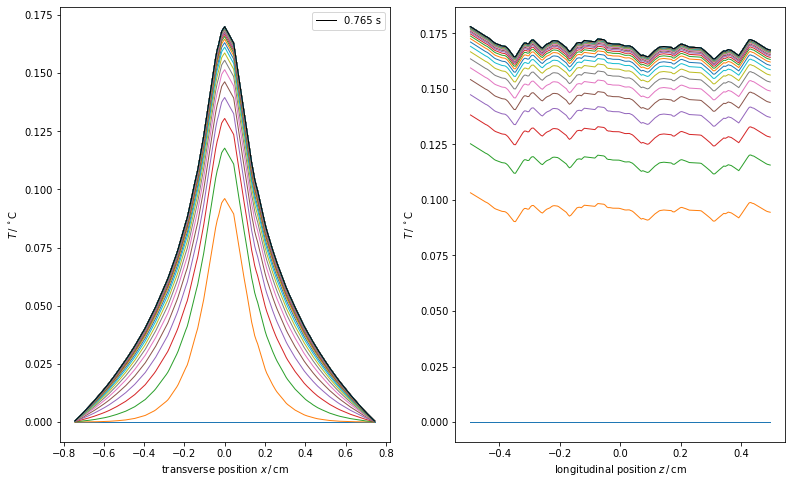

In [7]:
n_rows = 1
n_cols = 2
# fig_wd = 15
# default sizing here yields unit aspect ratio
# plt.figure(figsize = (fig_wd, fig_wd * n_rows // n_cols))
# plt.subplot(n_rows, n_cols, idx)

fig = plt.figure(figsize=(13,8))
fig1 = fig.add_subplot(n_rows, n_cols, 1)
fig2 = fig.add_subplot(n_rows, n_cols, 2)

tol = 8.e-3  # avoid points outside domain (for a coarse mesh, increase this value)
xv = np.linspace(xmin * (1 - tol), xmax * (1 - tol), 201)
zv = np.linspace(zmin * (1 - tol), zmax * (1 - tol), 201)
radpts = [(x_, 0, 0) for x_ in xv]
axipts = [(0, 0, z_) for z_ in zv]

idx = 0
t0 = tm.time()
for u in evolve():
    idx += 1
    ux = np.array([u(pt) for pt in radpts])
    uz = np.array([u(pt) for pt in axipts])
    fig1.plot(xv, ux, lw=1)
    fig2.plot(zv, uz, lw=1)  
t1 = tm.time()


fig1.plot(xv, ux, 'k', lw=1, label='{0:5.3f} s'.format(idx*dt))
fig1.legend()
fig2.plot(zv, uz, 'k', lw=1)  
#fig2.legend()

fig1.set_xlabel(r'transverse position $x\,/\,\mathrm{cm}$')
fig1.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')
fig2.set_xlabel(r'longitudinal position $z\,/\,\mathrm{cm}$')
fig2.set_ylabel(r'$T\,/\,{}^\circ\mathrm{C}$')

fig.savefig('heat_decay_profiles.pdf')
fig.show()

print('mesh density: %s, no. of tetrahedral elements: %s, no. of vertices: %s' %(mden, mesh.num_cells(), mesh.num_vertices()))
print("simulation time: %4.3f minutes" % ((t1 - t0)/60.0))
#print("simulation time: %4.3f seconds" % (t1 - t0))

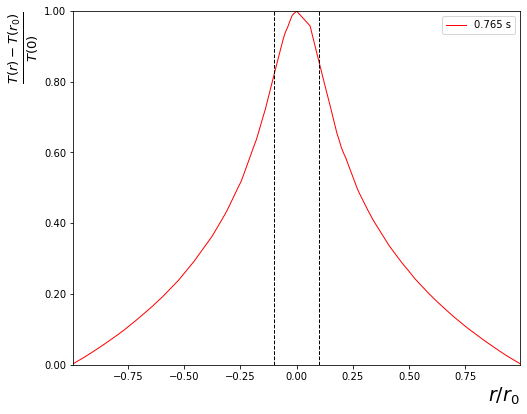

In [10]:
# create data for heat load width dotted lines overlay
lwvals_negx = -wdT/rad, -wdT/rad
lwvals_posx = wdT/rad, wdT/rad
lwvals_y = 0, np.max(ux/np.max(ux))

# plot transverse temperature profile at final time step
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv/rad, ux/np.max(ux),'r-', label='{0:5.3f} s'.format(idx*dt), linewidth = 1)
ax.plot(lwvals_negx, lwvals_y,'k--', linewidth = 1)
ax.plot(lwvals_posx, lwvals_y,'k--', linewidth = 1)
ax.set_xlim(-np.max(xv/rad), np.max(xv/rad))
ax.set_ylim(0, np.max(ux/np.max(ux)))
ax.set_xlabel(r'$r/r_0$', horizontalalignment='right', x=1.0, **hfontMed)
ax.set_ylabel(r'$\frac{T(r) - T(r_0)}{T(0)}$', horizontalalignment='right', y=1.0, **hfontMed)
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(1)
#plt.grid(True)
ax.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()

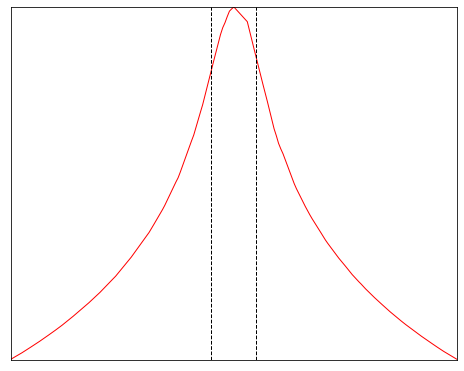

In [11]:
# plot transverse temperature profile at final time step w/o labels
fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
# ax.plot(xv/rad, ux/np.max(ux),'g-', label='{0:5.3f} s'.format(idx*dt), linewidth = 1)
ax.plot(xv/rad, ux/np.max(ux),'r-', linewidth = 1)
ax.plot(lwvals_negx, lwvals_y,'k--', linewidth = 1)
ax.plot(lwvals_posx, lwvals_y,'k--', linewidth = 1)
ax.set_xlim(-np.max(xv/rad), np.max(xv/rad))
ax.set_ylim(0, np.max(ux/np.max(ux)))
#ax.set_xlabel(r'$r/r_0$', horizontalalignment='right', x=1.0, **hfontMed)
#ax.set_ylabel(r'$\frac{T(r) - T(r_0)}{T(0)}$', horizontalalignment='right', y=1.0, **hfontMed)
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
#plt.xticks(1)
#plt.grid(True)
#ax.legend()
#fig.savefig('heat_decay_prof01.pdf')
fig.show()

$\textbf{Chenais Figure 5}$

<img src="figures/chenais_figfive01.png">

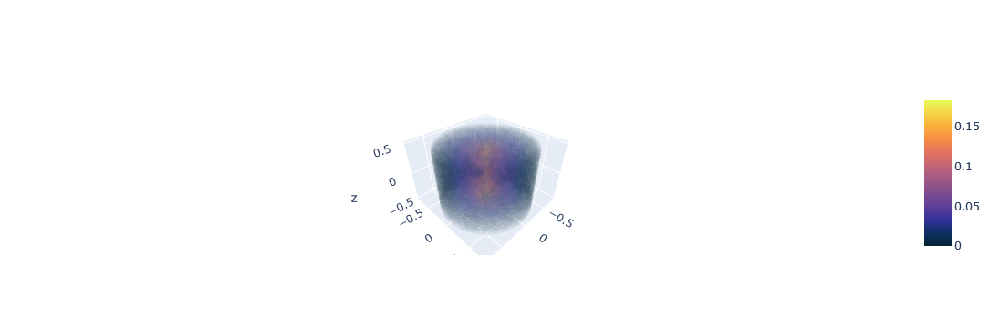

In [10]:
uvals = u.compute_vertex_values()

fig = plotly.graph_objects.Figure(
    data=[plotly.graph_objects.Mesh3d(
        x=xvals, y=yvals, z=zvals,
        i=ii, j=jj, k=kk,
        colorscale='thermal',
        intensity=uvals,
        alphahull=-1,
        opacity=0.020
    )]
)
fig.update_layout(scene_aspectmode='data')
fig.show()

In [10]:
uvals

array([0.00000000e+00, 5.62505111e-06, 7.83255459e-06, ...,
       6.03745129e-05, 7.72048733e-06, 0.00000000e+00])

In [13]:
# compute error in L2 norm
error_L2 = errornorm(u_n, u, 'L2')

*** Warning: Degree of exact solution may be inadequate for accurate result in errornorm.


In [14]:
# compute maximum error at vertices
vertex_values_u_n = u_n.compute_vertex_values(mesh)
vertex_values_u = u.compute_vertex_values(mesh)

error_max = np.max(np.abs(vertex_values_u_n - vertex_values_u))

In [15]:
# print errors
print('error_L2  = %e' %error_L2)
print('error_max = %e' %error_max)

error_L2  = 0.000000e+00
error_max = 0.000000e+00


In [ ]:
vertex_values_u_n

In [ ]:
# save solution to file in VTK format
vtkfile = File('cylinder_soln01.pvd')
vtkfile << u

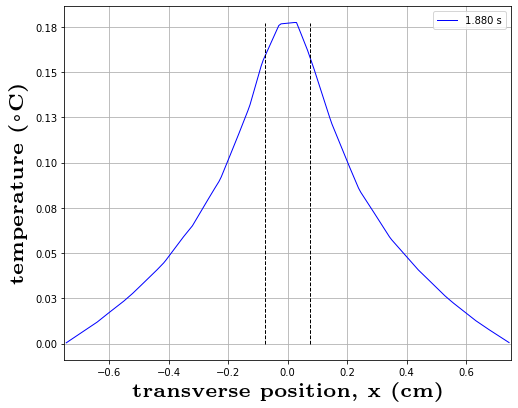

In [78]:

lwvals_negx = -wdT, -wdT
lwvals_posx = wdT, wdT

lwvals_ydegc = 0, np.max(ux)

fig = plt.figure(figsize=(8,6.5))
ax = fig.gca()
ax.plot(xv, ux,'b-', label='{0:5.3f} s'.format(idx*dt), linewidth = 1)
ax.plot(lwvals_negx, lwvals_ydegc,'k--', linewidth = 1)
ax.plot(lwvals_posx, lwvals_ydegc,'k--', linewidth = 1)
ax.set_xlim(-0.75, 0.75)
#ax.set_ylim(0, 0.18)
ax.set_xlabel(r'transverse position, x (cm)', **hfontMed)
ax.set_ylabel(r'temperature ($\circ$C)', **hfontMed)
#ax.set_title(r'asdf',**hfontLarge)
#ax.xaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%0.2f'))
#plt.xticks(tvals_10ms)
plt.grid(True)
ax.legend()

In [ ]:
# save solution to file in VTK format
vtkfile = File('poisson/solution.pvd')
vtkfile << u

In [ ]:
plot(mesh)

In [ ]:
# save results for export to ParaView
vtkfile = File('cylinder.pvd')